In [1]:
import numpy as np
import pandas as pd
from csv import writer
from random import randint
from scipy.stats import norm
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier

In [2]:
def PCA_plot_2d(X, Y, X_test, name):
    pca = PCA(n_components=2)
    x = pca.fit_transform(X)
    xt = pca.transform(X_test)
    plt.scatter(x[:, 0], x[:, 1], c=Y, cmap=plt.cm.coolwarm, edgecolor='k')
    plt.scatter(xt[:, 0], xt[:, 1], c='grey')
    plt.xlabel("x-axis")
    plt.ylabel("y-axis")
    plt.title(f"2d plot for {name}")
    plt.show()

# Read all datasets

In [3]:
output = []
trainDF_1 = pd.read_csv('Dataset_1_Training.csv')
trainDF_1 = trainDF_1.drop('ID_REF', axis=1)

trainDF_1 = trainDF_1.transpose()
X_train_1 = trainDF_1.iloc[:, :-2].to_numpy()
Y_train_1 = trainDF_1.iloc[:, -2:-1].to_numpy()
Y_train_2 = trainDF_1.iloc[:, -1:].to_numpy()

X_train_1 = np.delete(X_train_1, 108, axis=0)
Y_train_1 = np.delete(Y_train_1, 108, axis=0).flatten()
Y_train_2 = np.delete(Y_train_2, 108, axis=0).flatten()

X_test_1 = pd.read_csv('Dataset_1_Testing.csv')
X_test_1 = X_test_1.drop('ID_REF', axis=1).transpose().to_numpy()

In [4]:
trainDF_2 = pd.read_csv('Dataset_2_Training.csv')
trainDF_2 = trainDF_2.drop('ID_REF', axis=1)

trainDF_2 = trainDF_2.transpose()
X_train_2 = trainDF_2.iloc[:, :-4].to_numpy()
Y_train_3 = trainDF_2.iloc[:, -4:-3].to_numpy().flatten()
Y_train_4 = trainDF_2.iloc[:, -3:-2].to_numpy().flatten()
Y_train_5 = trainDF_2.iloc[:, -2:-1].to_numpy().flatten()
Y_train_6 = trainDF_2.iloc[:, -1:].to_numpy().flatten()

X_test_2 = pd.read_csv('Dataset_2_Testing.csv')
X_test_2 = X_test_2.drop('ID_REF', axis=1).transpose().to_numpy()

# CO1

Data Analytics for CO1:
pos samples frac: 0.248, neg samples frac: 0.752

Variance of features (D1): min var: 0.072, max var: 17.190, mean var: 1.164
Covariance of features (D1): min cov-var: 3.277, max cov-var: 7.651, mean cov-var: 4.844

explained variance: 0.99 -- 125 features
explained variance: 0.9 -- 100 features
explained variance: 0.8 -- 77 features
explained variance: 0.7 -- 58 features
explained variance: 0.6 -- 41 features
explained variance: 0.5 -- 26 features
min imp: 0.0000, max imp: 0.0064
min imp gene: gene_2, max imp gene: gene_11652



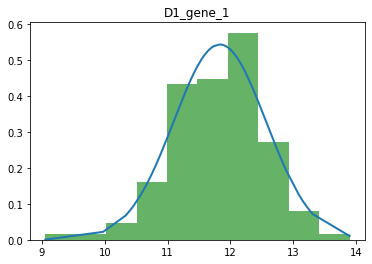

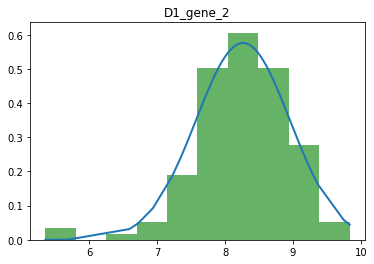

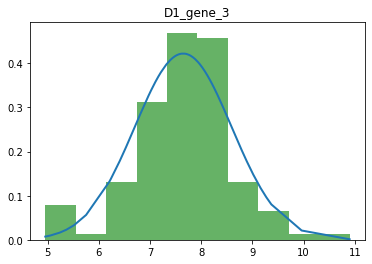

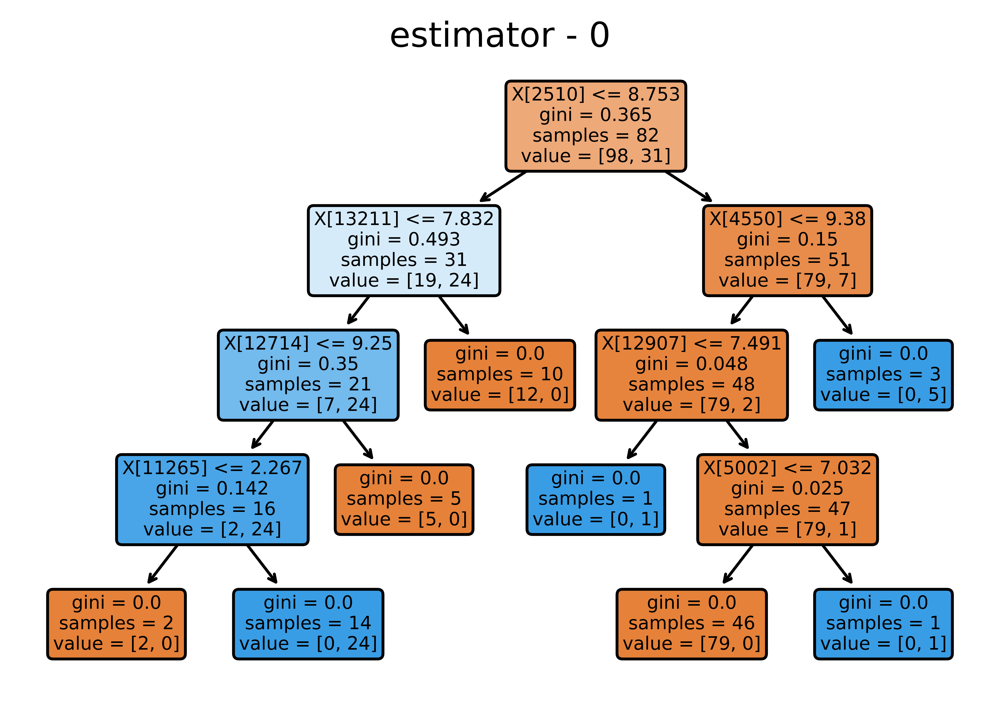

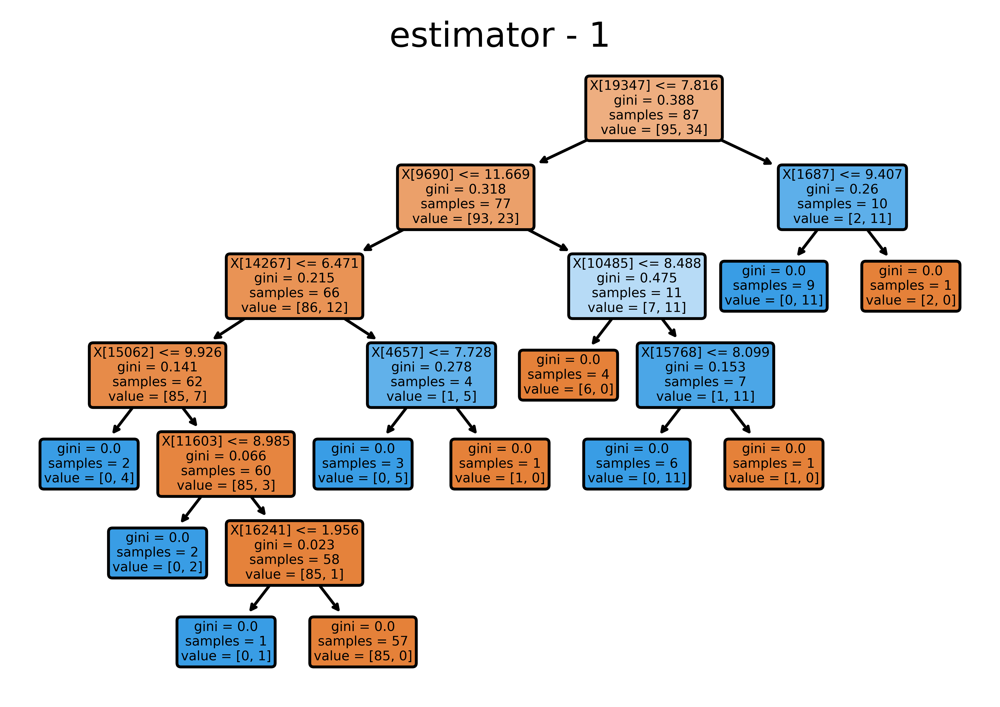

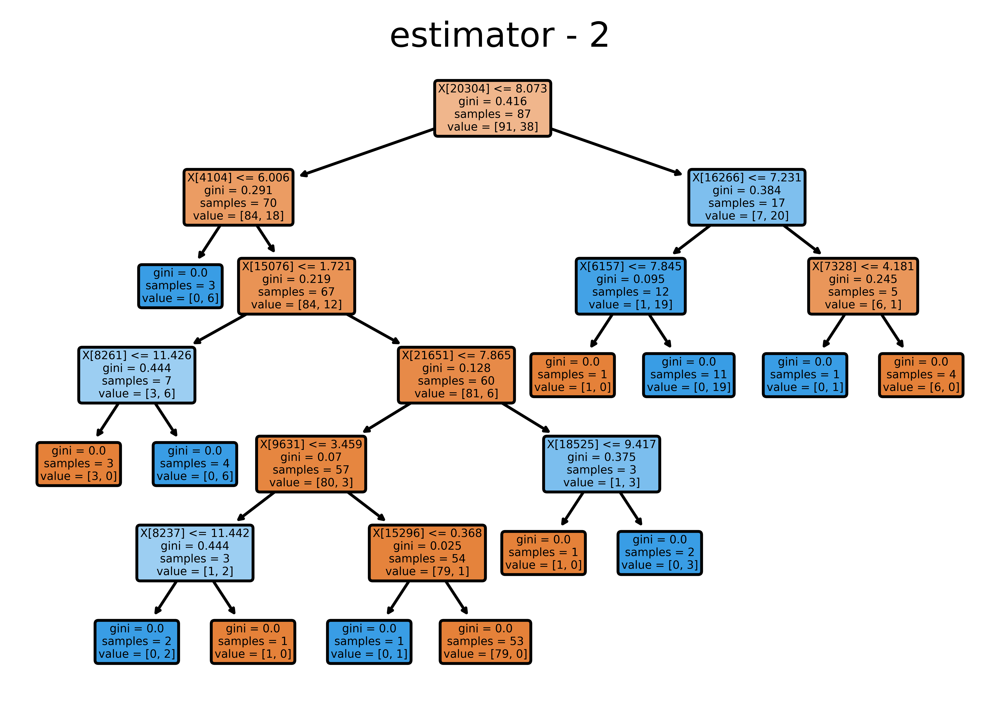

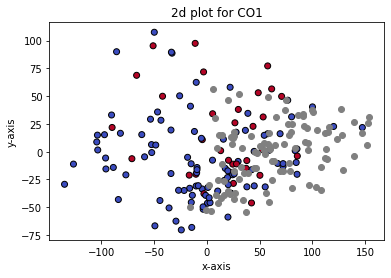

In [5]:
clf_ranF = RandomForestClassifier(random_state=0, n_jobs=-1)
clf_ranF.fit(X_train_1, Y_train_1)
output.extend(clf_ranF.predict(X_test_1))

print("Data Analytics for CO1:")
pos_samples = Y_train_1.sum()/len(Y_train_1)
neg_samples = 1 - pos_samples
print(f"pos samples frac:{pos_samples: .3f}, neg samples frac:{neg_samples: .3f}\n")

var = np.var(X_train_1, axis=0)
cov = np.cov(X_train_1)
print(f"Variance of features (D1): min var:{var.min(): .3f}, max var:{var.max(): .3f}, mean var:{var.mean(): .3f}")
print(f"Covariance of features (D1): min cov-var:{cov.min(): .3f}, max cov-var:{cov.max(): .3f}, mean cov-var:{cov.mean(): .3f}\n")

for i in [0.99, 0.9, 0.8, 0.7, 0.6, 0.5]:
    x = PCA(n_components=i, svd_solver="full").fit_transform(X_train_1)
    print(f"explained variance: {i} -- {x.shape[1]} features")

feat_imp = clf_ranF.feature_importances_
print(f"min imp:{feat_imp.min(): .4f}, max imp:{feat_imp.max(): .4f}")
print(f"min imp gene: gene_{feat_imp.argmin() + 2}, max imp gene: gene_{feat_imp.argmax() + 2}\n")

for i in range(3):
    h = X_train_1[:, i]
    h.sort()
    pdf = norm.pdf(h, np.mean(h), np.std(h))
    plt.plot(h, pdf, linewidth=2)
    plt.hist(h, density=True, alpha=0.6, color='g')
    plt.title(f"D1_gene_{i+1}")
    plt.show()
    
for i in range(3):
    plot_tree(clf_ranF.estimators_[i], filled=True, rounded=True)
    plt.title(f"estimator - {i}")
    plt.gcf().set_dpi(1200)
    plt.show()

PCA_plot_2d(X_train_1, Y_train_1, X_test_1, name="CO1")

# CO2

Data Analytics for CO2:
pos samples frac: 0.411, neg samples frac: 0.589

min imp: 0.0000, max imp: 0.3045
min imp gene: gene_2, max imp gene: gene_1987



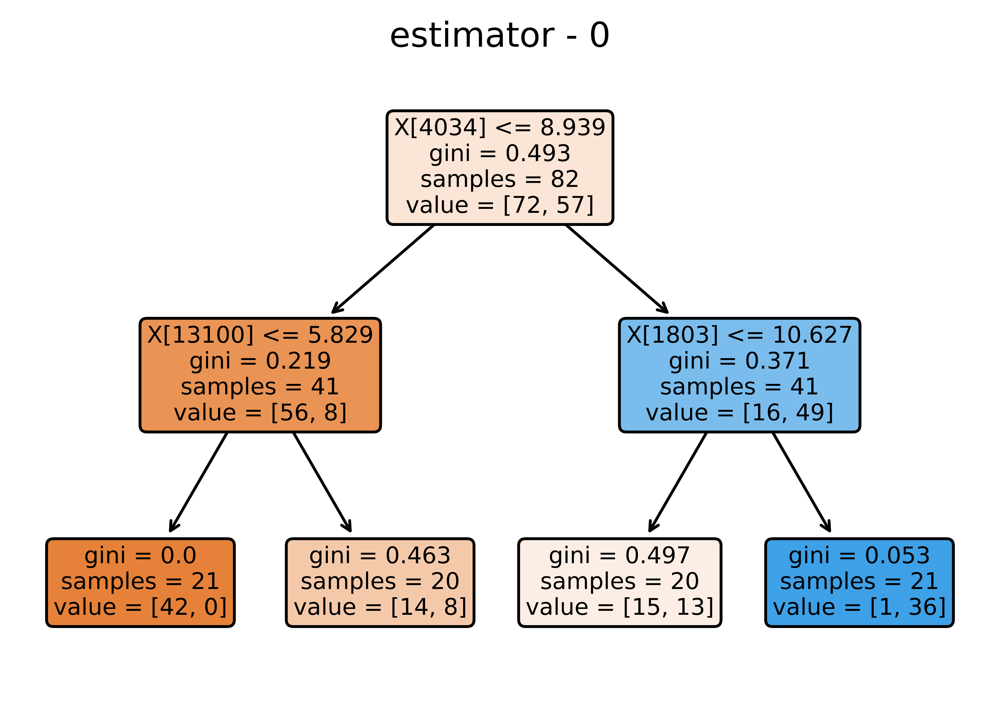

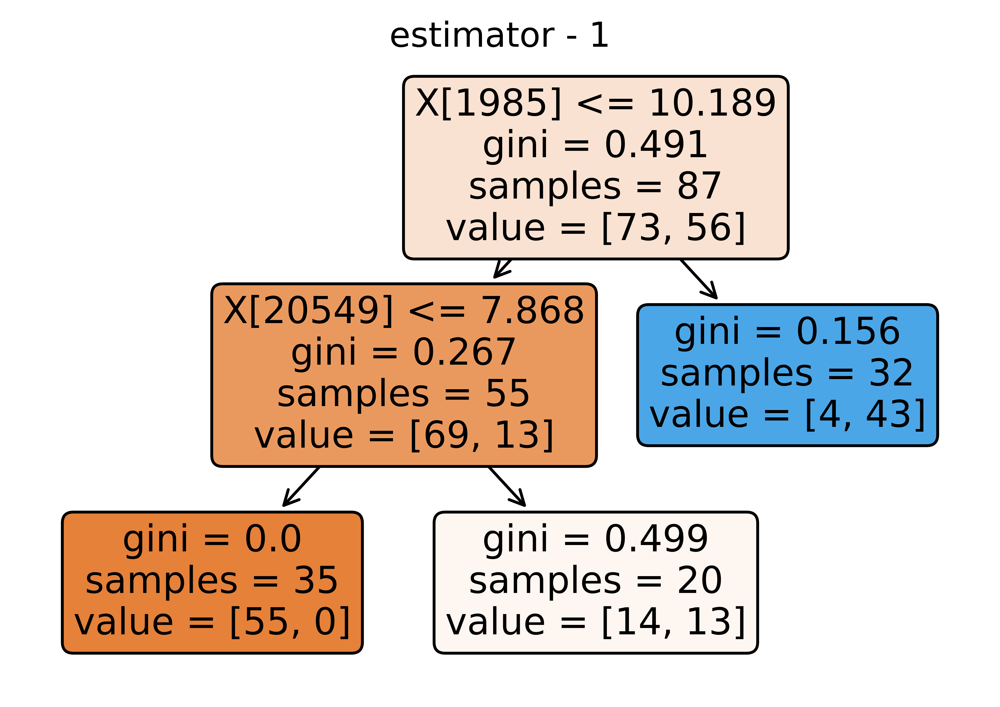

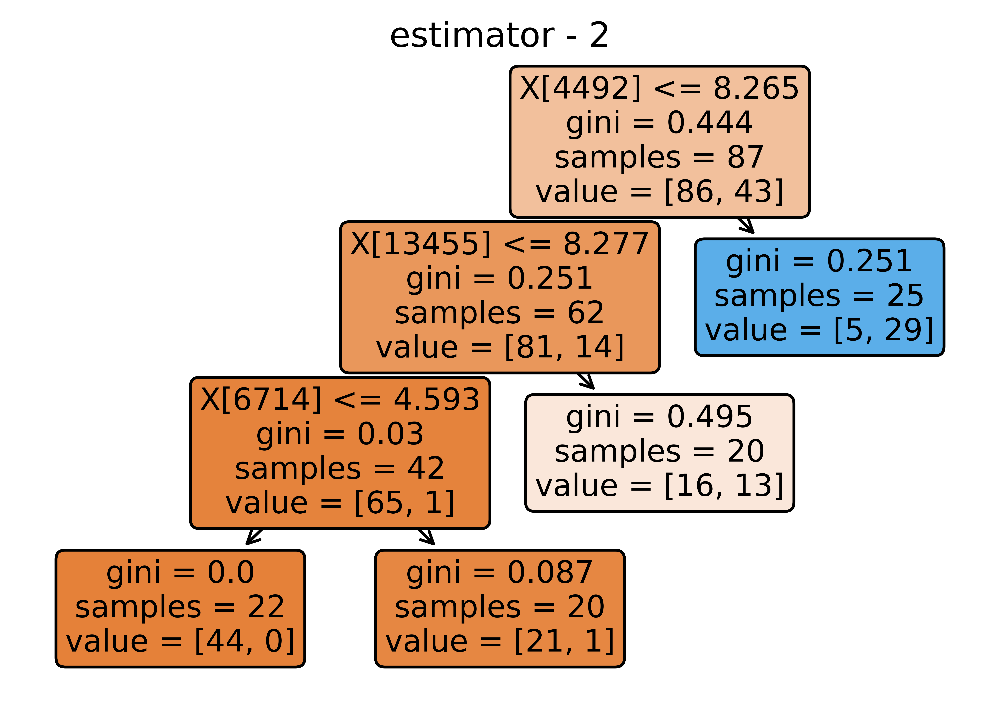

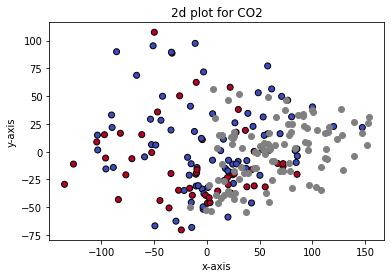

In [6]:
clf_ranF = RandomForestClassifier(random_state=0, n_jobs=-1, min_samples_leaf=20, max_features=None)
clf_ranF.fit(X_train_1, Y_train_2)
output.extend(clf_ranF.predict(X_test_1))

print("Data Analytics for CO2:")
pos_samples = Y_train_2.sum()/len(Y_train_2)
neg_samples = 1 - pos_samples
print(f"pos samples frac:{pos_samples: .3f}, neg samples frac:{neg_samples: .3f}\n")

feat_imp = clf_ranF.feature_importances_
print(f"min imp:{feat_imp.min(): .4f}, max imp:{feat_imp.max(): .4f}")
print(f"min imp gene: gene_{feat_imp.argmin() + 2}, max imp gene: gene_{feat_imp.argmax() + 2}\n")

for i in range(3):
    plot_tree(clf_ranF.estimators_[i], filled=True, rounded=True)
    plt.title(f"estimator - {i}")
    plt.gcf().set_dpi(1200)
    plt.show()

PCA_plot_2d(X_train_1, Y_train_2, X_test_1, name="CO2")

# CO3

Data Analytics for CO3:
pos samples frac: 0.244, neg samples frac: 0.756

Variance of features (D2): min var: 0.067, max var: 13.085, mean var: 0.991
Covariance of features (D2): min cov-var: 2.873, max cov-var: 7.007, mean cov-var: 4.361

explained variance: 0.99 -- 331 features
explained variance: 0.9 -- 266 features
explained variance: 0.8 -- 205 features
explained variance: 0.7 -- 150 features
explained variance: 0.6 -- 102 features
explained variance: 0.5 -- 62 features
min imp: 0.0000, max imp: 0.0187
min imp gene: gene_2, max imp gene: gene_38708



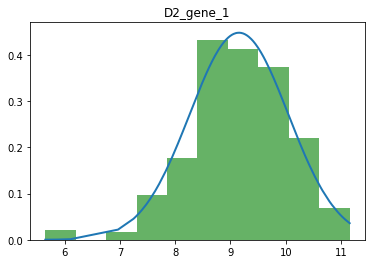

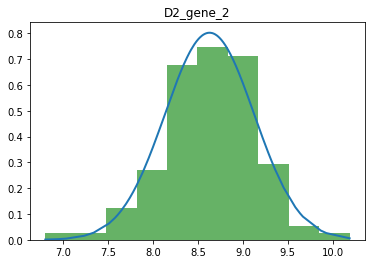

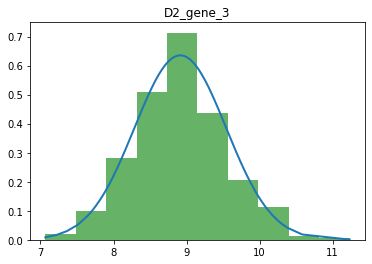

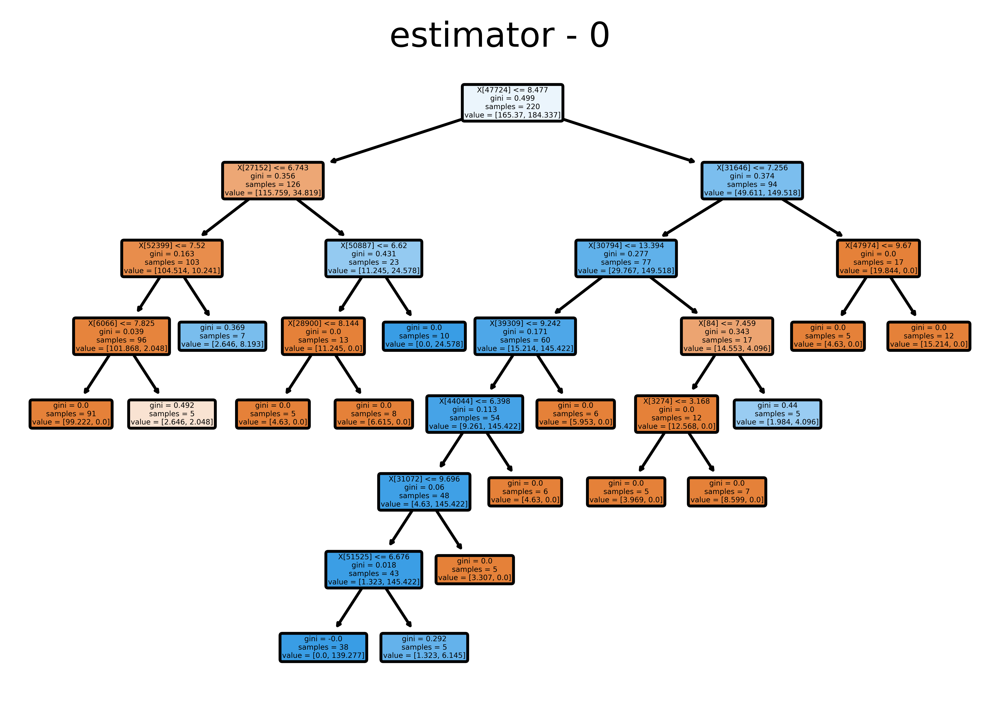

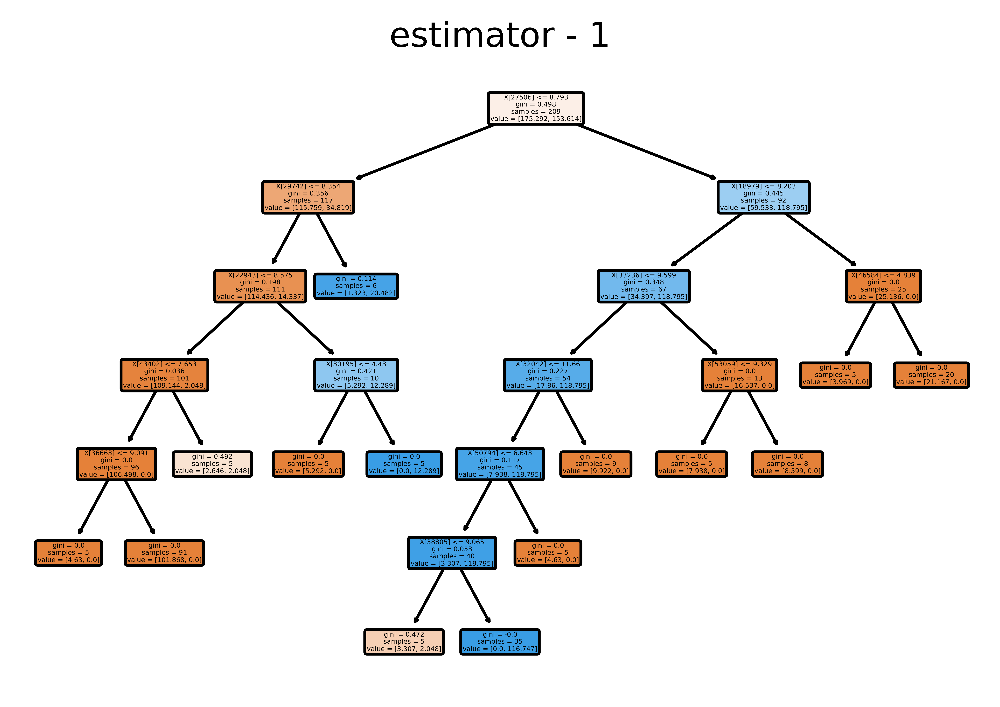

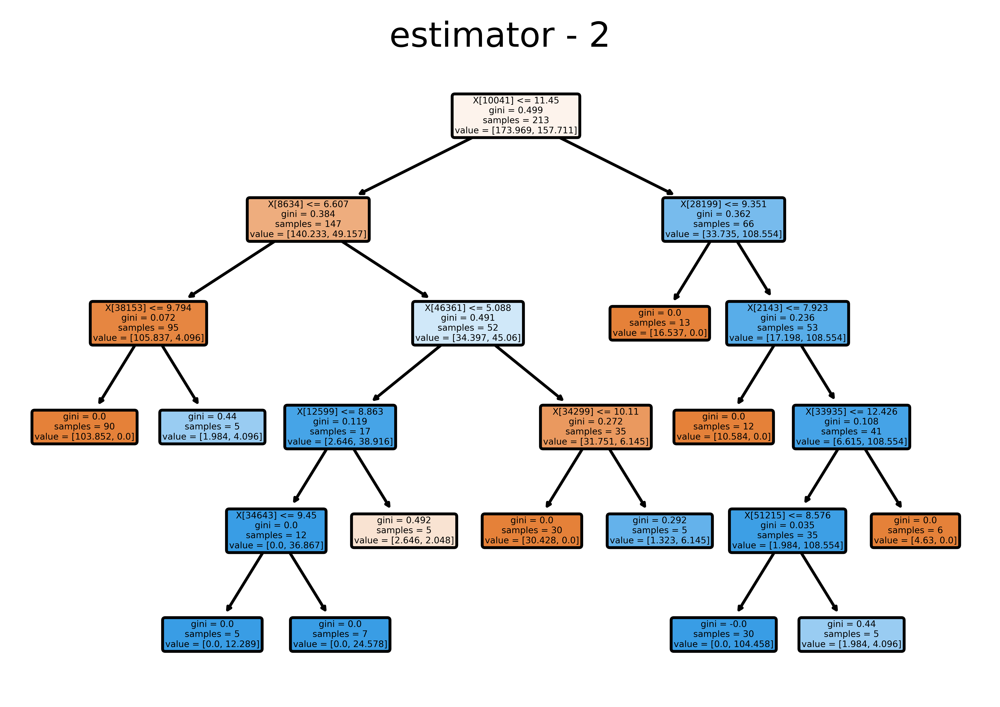

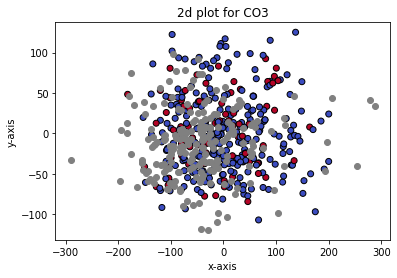

In [7]:
np.random.seed(101)
clf_ranF = RandomForestClassifier(n_jobs=-1, min_samples_leaf=5, max_features=None, class_weight='balanced')
clf_ranF.fit(X_train_2, Y_train_3)
output.extend(clf_ranF.predict(X_test_2))

print("Data Analytics for CO3:")
pos_samples = Y_train_3.sum()/len(Y_train_3)
neg_samples = 1 - pos_samples
print(f"pos samples frac:{pos_samples: .3f}, neg samples frac:{neg_samples: .3f}\n")

var = np.var(X_train_2, axis=0)
cov = np.cov(X_train_2)
print(f"Variance of features (D2): min var:{var.min(): .3f}, max var:{var.max(): .3f}, mean var:{var.mean(): .3f}")
print(f"Covariance of features (D2): min cov-var:{cov.min(): .3f}, max cov-var:{cov.max(): .3f}, mean cov-var:{cov.mean(): .3f}\n")

for i in [0.99, 0.9, 0.8, 0.7, 0.6, 0.5]:
    x = PCA(n_components=i, svd_solver="full").fit_transform(X_train_2)
    print(f"explained variance: {i} -- {x.shape[1]} features")

feat_imp = clf_ranF.feature_importances_
print(f"min imp:{feat_imp.min(): .4f}, max imp:{feat_imp.max(): .4f}")
print(f"min imp gene: gene_{feat_imp.argmin() + 1}, max imp gene: gene_{feat_imp.argmax() + 1}\n")

for i in range(3):
    h = X_train_2[:, i]
    h.sort()
    pdf = norm.pdf(h, np.mean(h), np.std(h))
    plt.plot(h, pdf, linewidth=2)
    plt.hist(h, density=True, alpha=0.6, color='g')
    plt.title(f"D2_gene_{i+1}")
    plt.show()
    
for i in range(3):
    plot_tree(clf_ranF.estimators_[i], filled=True, rounded=True)
    plt.title(f"estimator - {i}")
    plt.gcf().set_dpi(1200)
    plt.show()

PCA_plot_2d(X_train_2, Y_train_3, X_test_2, name="CO3")

# CO4

Data Analytics for CO4:
pos samples frac: 0.150, neg samples frac: 0.850

min imp: 0.0000, max imp: 0.0225
min imp gene: gene_1, max imp gene: gene_3587



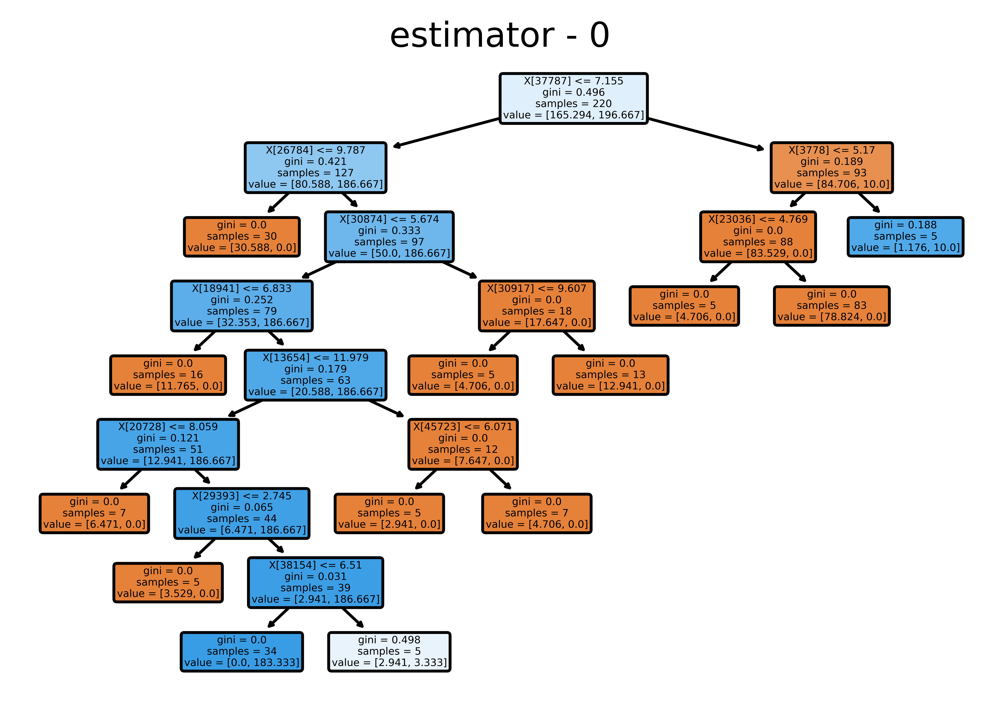

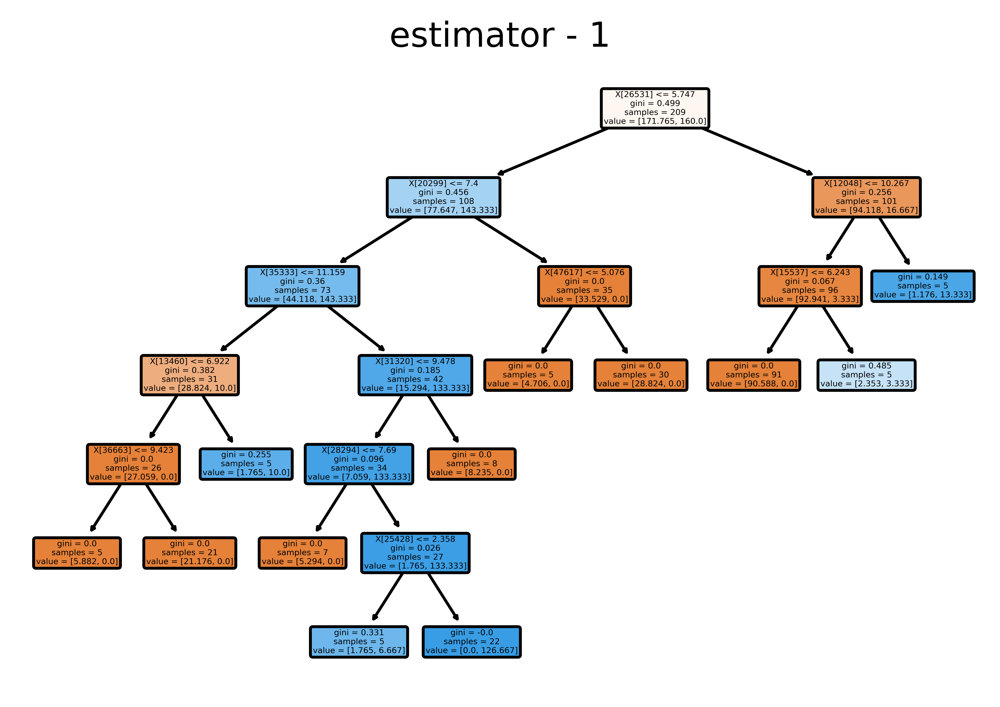

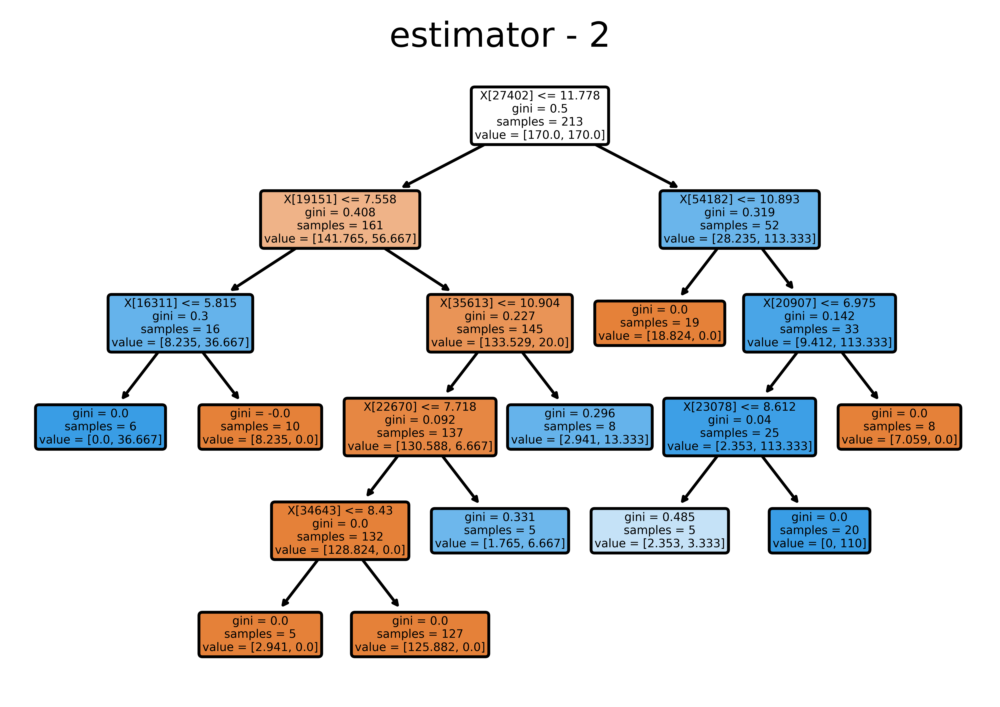

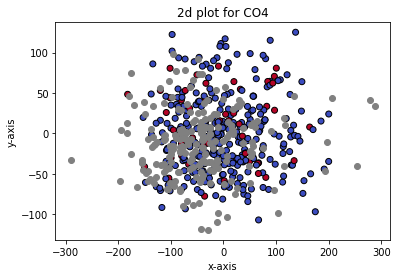

In [8]:
np.random.seed(101)
clf_ranF = RandomForestClassifier(n_jobs=-1, min_samples_leaf=5, max_features=None, class_weight='balanced')
clf_ranF.fit(X_train_2, Y_train_4)
output.extend(clf_ranF.predict(X_test_2))

print("Data Analytics for CO4:")
pos_samples = Y_train_4.sum()/len(Y_train_4)
neg_samples = 1 - pos_samples
print(f"pos samples frac:{pos_samples: .3f}, neg samples frac:{neg_samples: .3f}\n")

feat_imp = clf_ranF.feature_importances_
print(f"min imp:{feat_imp.min(): .4f}, max imp:{feat_imp.max(): .4f}")
print(f"min imp gene: gene_{feat_imp.argmin() + 1}, max imp gene: gene_{feat_imp.argmax() + 1}\n")
    
for i in range(3):
    plot_tree(clf_ranF.estimators_[i], filled=True, rounded=True)
    plt.title(f"estimator - {i}")
    plt.gcf().set_dpi(1200)
    plt.show()

PCA_plot_2d(X_train_2, Y_train_4, X_test_2, name="CO4")

# CO5

Data Analytics for CO5:
pos samples frac: 0.429, neg samples frac: 0.571

min imp: 0.0000, max imp: 0.4747
min imp gene: gene_1, max imp gene: gene_13857



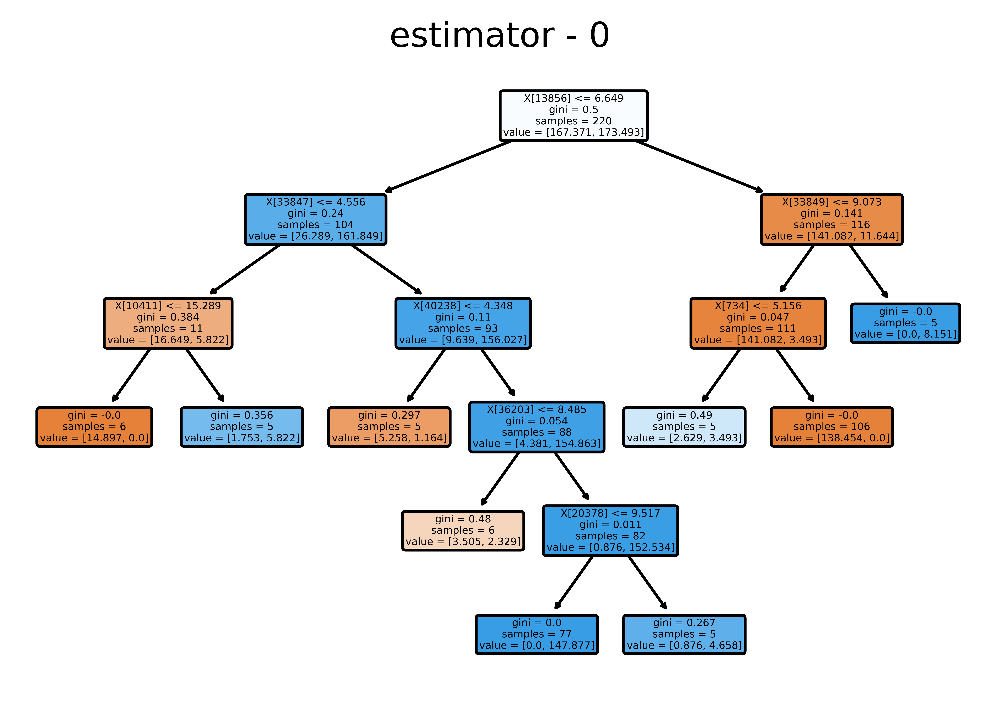

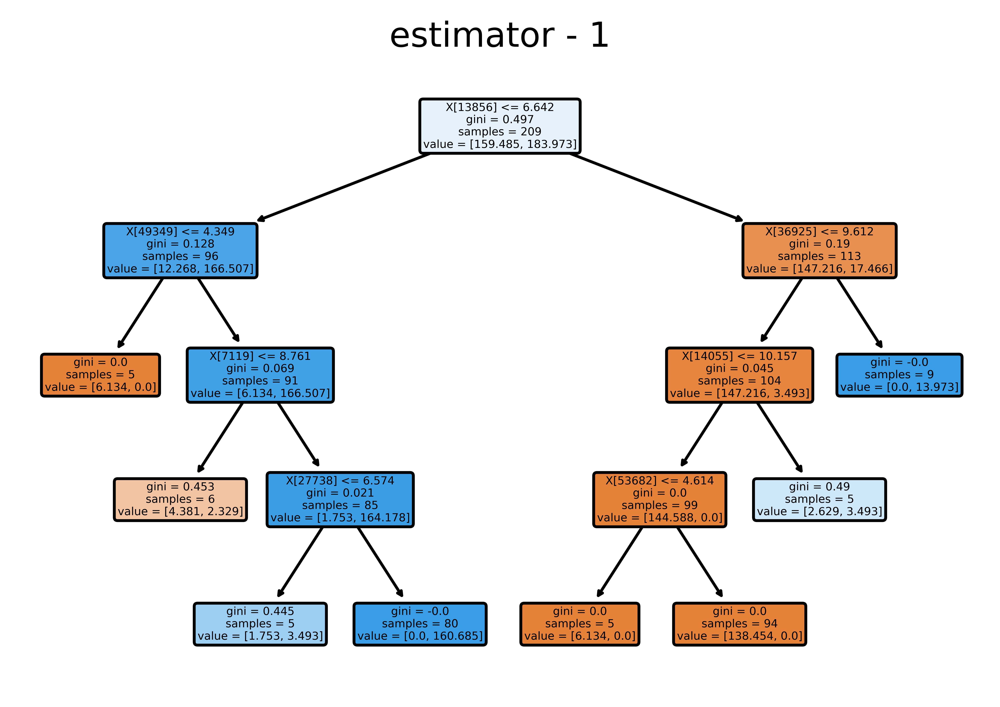

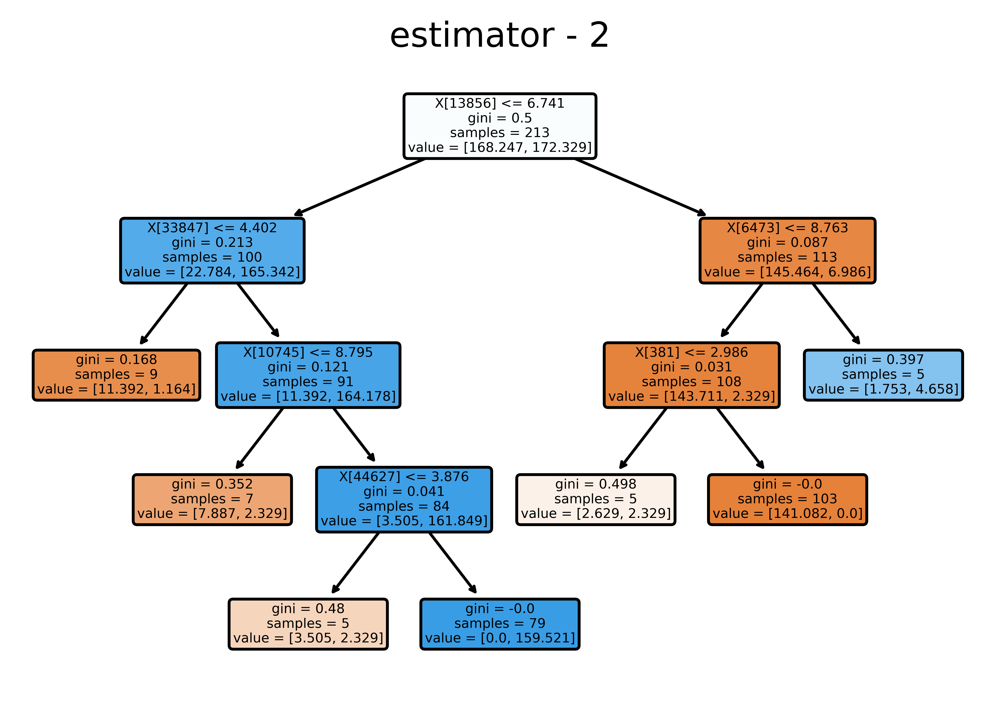

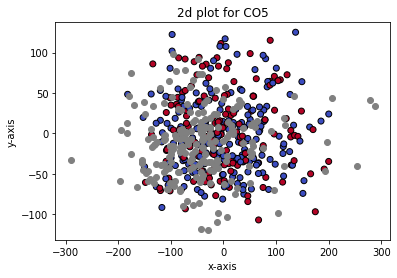

In [9]:
np.random.seed(101)
clf_ranF = RandomForestClassifier(n_jobs=-1, min_samples_leaf=5, max_features=None, class_weight='balanced')
clf_ranF.fit(X_train_2, Y_train_5)
output.extend(clf_ranF.predict(X_test_2))

print("Data Analytics for CO5:")
pos_samples = Y_train_5.sum()/len(Y_train_5)
neg_samples = 1 - pos_samples
print(f"pos samples frac:{pos_samples: .3f}, neg samples frac:{neg_samples: .3f}\n")

feat_imp = clf_ranF.feature_importances_
print(f"min imp:{feat_imp.min(): .4f}, max imp:{feat_imp.max(): .4f}")
print(f"min imp gene: gene_{feat_imp.argmin() + 1}, max imp gene: gene_{feat_imp.argmax() + 1}\n")
    
for i in range(3):
    plot_tree(clf_ranF.estimators_[i], filled=True, rounded=True)
    plt.title(f"estimator - {i}")
    plt.gcf().set_dpi(1200)
    plt.show()

PCA_plot_2d(X_train_2, Y_train_5, X_test_2, name="CO5")

# CO6

Data Analytics for CO6:
pos samples frac: 0.588, neg samples frac: 0.412

min imp: 0.0000, max imp: 0.0126
min imp gene: gene_1, max imp gene: gene_18874



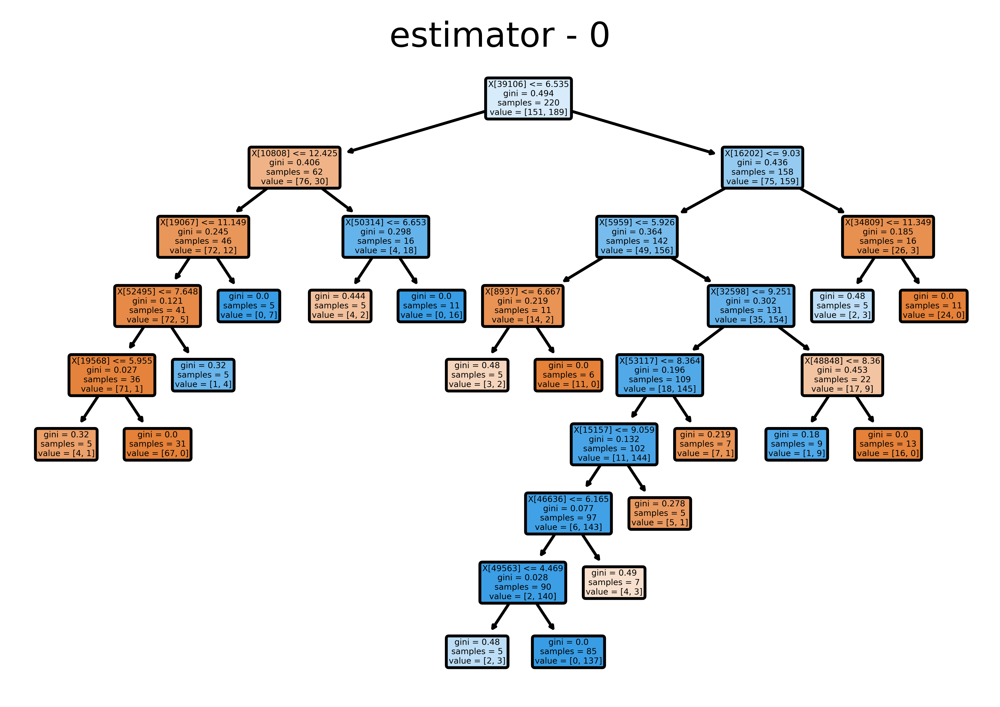

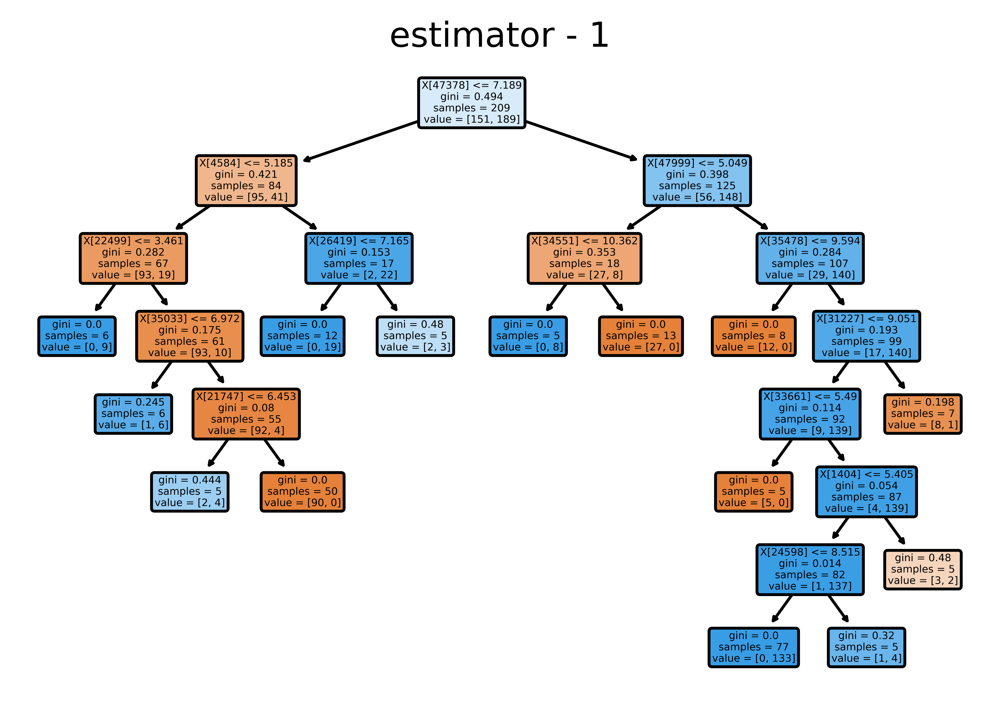

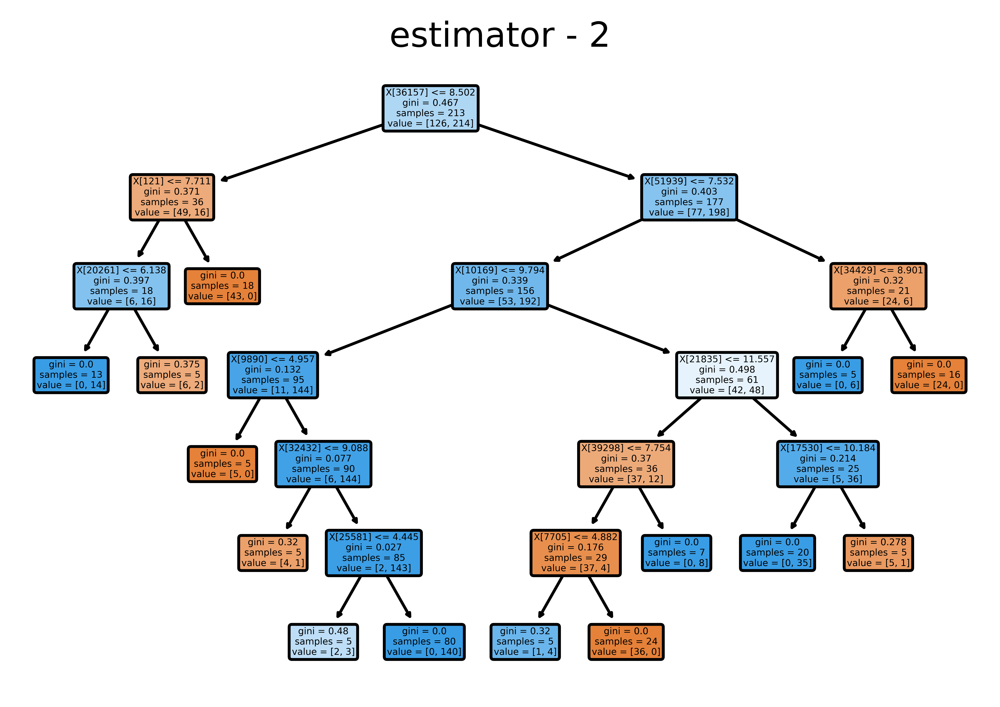

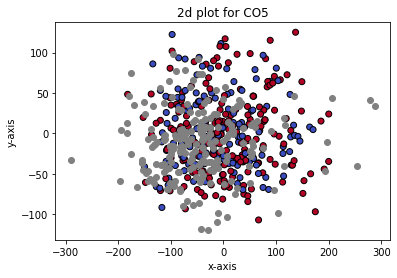

In [10]:
np.random.seed(101)
clf_ranF = RandomForestClassifier(n_jobs=-1, min_samples_leaf=5, max_features=None)
clf_ranF.fit(X_train_2, Y_train_6)
output.extend(clf_ranF.predict(X_test_2))

print("Data Analytics for CO6:")
pos_samples = Y_train_6.sum()/len(Y_train_6)
neg_samples = 1 - pos_samples
print(f"pos samples frac:{pos_samples: .3f}, neg samples frac:{neg_samples: .3f}\n")

feat_imp = clf_ranF.feature_importances_
print(f"min imp:{feat_imp.min(): .4f}, max imp:{feat_imp.max(): .4f}")
print(f"min imp gene: gene_{feat_imp.argmin() + 1}, max imp gene: gene_{feat_imp.argmax() + 1}\n")
    
for i in range(3):
    plot_tree(clf_ranF.estimators_[i], filled=True, rounded=True)
    plt.title(f"estimator - {i}")
    plt.gcf().set_dpi(1200)
    plt.show()

PCA_plot_2d(X_train_2, Y_train_6, X_test_2, name="CO5")

# Write to CSV

In [11]:
with open("cs21m070_cs21m066_final_result.csv", 'w', newline='') as the_file:
    csv_writer = writer(the_file)
    nrows = len(output)
    csvfile = [[i, int(y)] for (i, y) in zip(range(nrows), output)]
    csv_writer.writerow(["Id", "Predicted"])
    csv_writer.writerows(csvfile)
    
print("CSV written, run Complete!")

CSV written, run Complete!
